#Visualisation and analysis of simulated loci motion

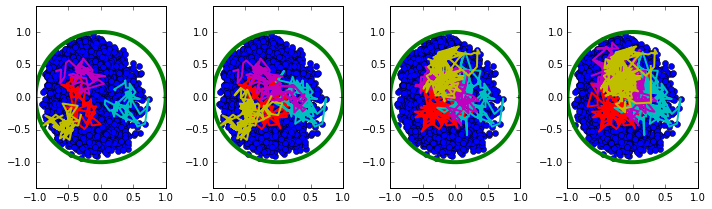

In [1]:
import cPickle
name= "subd_mid"
with open(name,"r") as f:
    [x,y,z] = cPickle.load(f)

F = figure(figsize=(10,3))
n=4
for iplot,size in enumerate([50,100,150,200]):
    ax = F.add_subplot(1,n,iplot+1)
    plot(x,y,"o")
    c = np.arange(0,2*3.1415,0.01)
    plot(np.cos(c),np.sin(c))
    
    ranges = range(0,10000,size)
    lranges = len(ranges)
    sub  = int(lranges/4)
    for i in ranges[::sub][:4]:
        plot(x[i:i+size],y[i:i+size],linewidth=2)
    axis("equal")
    xticks([-1,-0.5,0,0.5,1])

F.tight_layout()

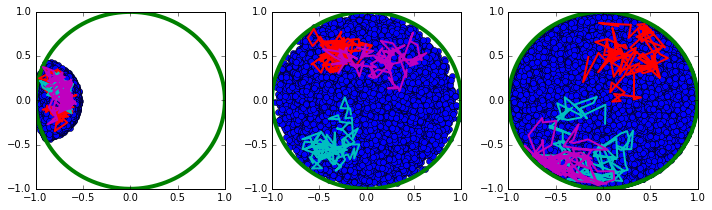

In [369]:
import cPickle
F = figure(figsize=(10,3))

for igene,gene in  enumerate([303,503,780]):
    
    if gene == 780:
        name = "subd_teloRMean"
    else:
        name = "subd_post%iMean"%gene

    with open(name,"r") as f:
        [x,y,z] = cPickle.load(f)
    n=3
    for size in [100]:
        ax = F.add_subplot(1,n,igene+1)
        plot(x,y,"o")
        c = np.arange(0,2*3.1415,0.01)
        plot(np.cos(c),np.sin(c))

        ranges = range(0,29000,size)
        lranges = len(ranges)
        sub  = int(lranges/4)
        for i in ranges[::sub][:3]:
            plot(x[i:i+size],y[i:i+size],linewidth=2)
        #axis("equal")
        xticks([-1,-0.5,0,0.5,1])
        xlim(-1,1)
        ylim(-1,1)

F.tight_layout()
savefig("/home/jarbona/Dropbox/RNN/Paper/#Figures/Part_of_figures/FigUnitrajs.png")


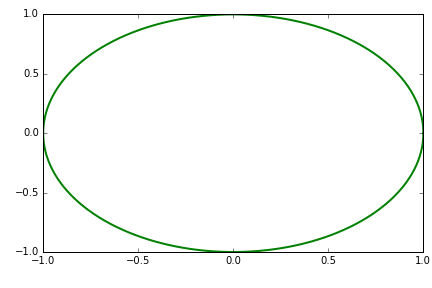
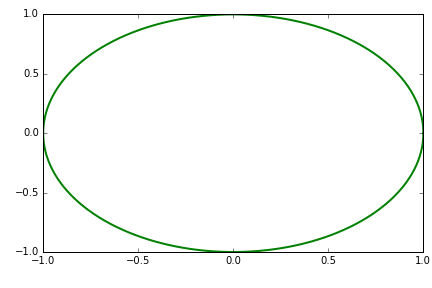
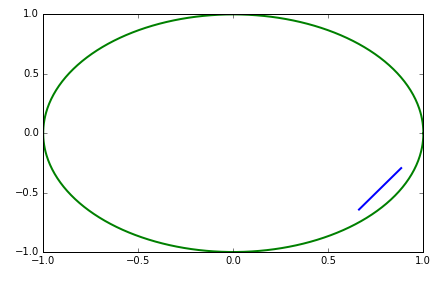
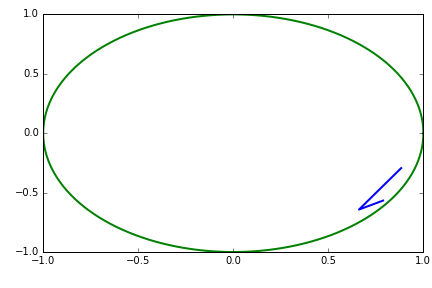
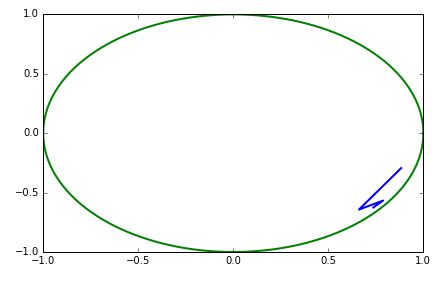
...
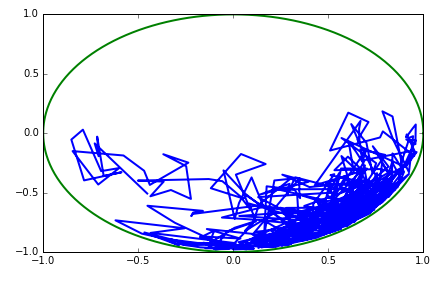
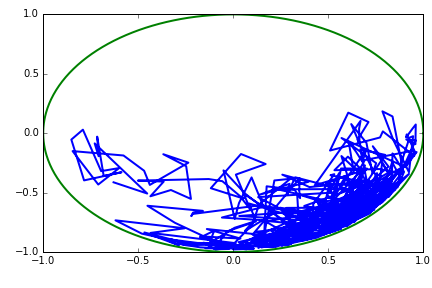
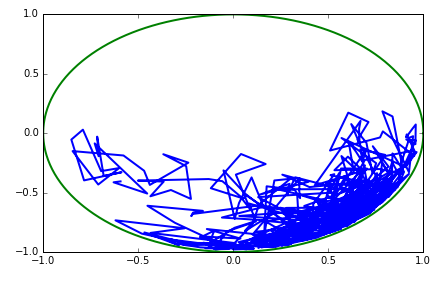
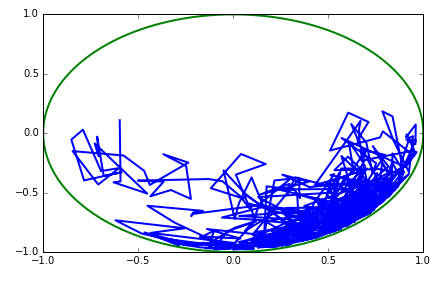
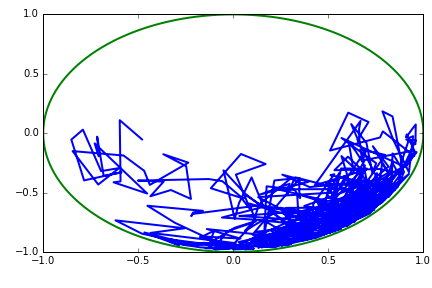

In [3]:
# JSAnimation import available at https://github.com/jakevdp/JSAnimation
from JSAnimation import IPython_display
from matplotlib import animation

name= "subd_st_teloRMean"
with open(name,"r") as f:
    [x,y,z] = cPickle.load(f)

# create a simple animation
maxi = 500
x = x[:maxi]
y = y[:maxi]
fig = plt.figure()
#ax = plt.axes(xlim=(x.min(), x.max()), ylim=(y.min(), y.max()))
ax = plt.axes(xlim=(-1,1), ylim=(-1,1))


line, = ax.plot([], [], lw=2)
line2, = ax.plot([], [], lw=2)

c = np.arange(0,2*3.1415,0.01)
X = np.cos(c),np.sin(c)

#x = np.linspace(0, 10, 1000)
def init():
    line.set_data([], [])
    #line2.set_data([],[])
    line2.set_data(X[0],X[1])

    return line,line2

def animate(i):
    line.set_data(x[:i],y[:i])
    
    return line,

animation.FuncAnimation(fig, animate, init_func=init,
                        frames=len(x), interval=20, blit=True)

In [153]:
#Loading the model.
#Can take a while

from Specialist_layer import return_layer_paper

graph3 = return_layer_paper(n_layers=4,inputsize=6,permutation=False,output=False)
graph3.load_weights("../cluster_theano_myriad0/weight-folder/4layer-LSTM-uniform-add-error-and-400-3D-suite3-new-noise_7_138")

In [191]:
graph3D = return_layer_paper(n_layers=4,inputsize=6,permutation=True,output=True)
graph3D.load_weights("../cluster_theano_myriad/weight-folder/4layer-LSTM-remove-small-fraction-and-400-sub-3D-suite3_7_138")

In [264]:
graph2D = return_layer_paper(n_layers=4,inputsize=5,permutation=True,output=True)
graph2D.load_weights("/home/jarbona/cluster_theano/weight-folder/4layer-LSTM-remove-small-fraction-and-400-sub-suite2_7_138")


In [374]:
#graph_uniform2D = return_layer_paper(n_layers=4,inputsize=5,permutation=False,output=False)
graph_uniform2D.load_weights("/home/jarbona/cluster_theano/weight-folder/4layer-LSTM-uniform-add-error-and-400-2D_7_138")


In [101]:
def collapse7(arr):
    arr[arr == 10] = 7
    arr[arr == 11] = 9
    return arr

In [19]:
#graph3.load_weights("pure_miss_3_30")
#graph3.load_weights("pure_no_miss_13_96")
def load_weights_old(graph, filepath):
    '''Load weights from a HDF5 file.
    '''
    import h5py
    f = h5py.File(filepath, mode='r')
    g = f['graph']
    weights = [g['param_{}'.format(p)] for p in range(g.attrs['nb_params'])]
    start = 0
    
    for nl,l in enumerate(graph.layers):
        p = l.trainable_weights + l.non_trainable_weights
        #print p
        if len(p) > 0:
            graph.layers[nl].set_weights(weights[start:start+len(p)])
        start += len(p)
    f.close()
    
#graph3.load_weights("saved_weights/without_noise_7_66")
#graph3.load_weights("saved_weights/without_noise_2_18")

#graph3.load_weights("old_weights/without_noise_7_60")

load_weights_old(graph3,"saved_weights/without_noise_7_66")

In [291]:
#Tool to create trajectory with different size and subsampling for analysis

from Tools import create_random_alpha,traj_to_dist

def load_subd(name,size,sub=1,threshold_sphere=0.9,noise_level=0,ndim=3):

    percent_sphere = []
    with open(name,"r") as f:
        [x,y,z] = cPickle.load(f)
        
    noise = np.array(x[:-1]-x[1:]).std()
    #print noise, np.abs(np.array(x[:-1]-x[1:])).mean()
    Normed = []
    trajs=[]
    #print len(x)
    N = int(len(x)/sub/size)-2
    size *= sub
    for i in range(0,N):

        Tr = np.array([x[i*size:(i+1)*size+1][::sub],
                       y[i*size:(i+1)*size+1][::sub],
                       z[i*size:(i+1)*size+1][::sub]]).T
        
        
        
        Tr = Tr[::,:3] #+ np.random.normal(0,noise,Tr.shape)
        if noise_level != 0:
            Tr += np.random.normal(0,noise*noise_level,Tr.shape)
        
        d = np.sum(Tr**2,axis=1)**0.5
        
        Tr = Tr[::,:ndim]
        alligned_traj,normed,alpha,_ = traj_to_dist(Tr ,ndim=ndim)

        trajs.append(alligned_traj)
        Normed.append(normed)
        percent_sphere.append( np.mean(d>threshold_sphere))
    Normed = np.array(Normed)
    
    return Normed, trajs, percent_sphere


## Visualisation of the category of motion as a function of the proximity to the surface

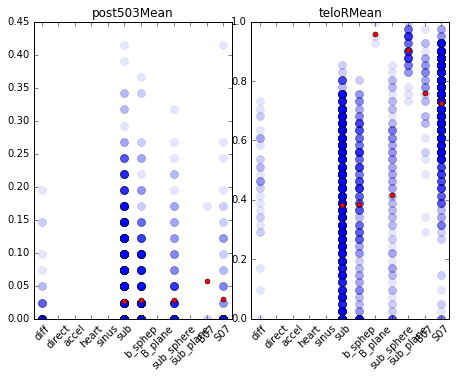

In [154]:
from Tools import M1
M3 = ["diff","direct","accel","heart","sinus","sub","b_sphep","B_plane","sub_sphere","sub_plane","B07","S07"]
M3b = ["diff","direct","accel","heart","sinus","sub","b_sphep","B_plane","sub_sphere","sub_plane"]


F = figure(figsize=(10,5))
for iname,name in enumerate(["subd_post503Mean","subd_teloRMean"]):
    
    ax = F.add_subplot(1,3,iname + 1)
    ax.set_title(name.split("_")[1])
    
    normed,trajs,p = load_subd(name,40,sub=1,threshold_sphere=0.9)
    pred0 = graph3.predict({"input1":np.array([t for t in normed])},batch_size=50)
    pred0["category"] = pred0["category"][::,newaxis,::]

    pred_RNN_cat = pred0["category"]

    maxp = []

    MR = M3
    
    cat = np.array(pred_RNN_cat).argmax(axis=2)

    plot(cat,p,"o",markersize=8,alpha=0.1)
    
    for i in range(5,12):
        #print cat[::,0]==i
        mean = np.array(p)[cat[::,0]==i].mean()
        
        if not np.isnan(mean):
            plot([i],[mean],"o",color="red",markersize=5)
    xlim(-0.5,len(M3)-0.5)
    xticks(range(len(M3)),M3,rotation=45)
    #print np.mean(np.array(p)>0.9)

## Analysis of the proportion between the different motion as a function of the trajectory length

In [104]:
from Tools import M1


name  = "subd_post503Mean"
    
def proportion_f_length(name,plot=False):
    stud = [40,50,100,125,150,175,200,300,350,400]
    ratio = {"sub":[],"sub_sphere":[],"sub_plan0p7":[],"length":[],"sub_plan":[]}
    if plot:
        F = figure(figsize=(10,5))

    for ilength,length in enumerate(stud):

        if plot:
            ax = F.add_subplot(1,len(stud),ilength + 1)
            ax.set_title(name.split("_")[1]+" "+str(length))

        pred0 = graph3.predict({"input1":np.array([t for t in load_subd(name,length,sub=1)[0]])},batch_size=100)
        pred0["category"] = pred0["category"][::,newaxis,::]

        pred_RNN_cat = pred0["category"]
        cat = np.array(pred_RNN_cat).argmax(axis=2)
        cat = collapse7(cat)

        ratio["sub"].append(np.sum( cat == 5) / 1.0/len(cat))
        ratio["sub_plan"].append(np.sum( cat == 9) / 1.0/len(cat))
        ratio["sub_sphere"].append(np.sum( cat == 8) / 1.0/len(cat))
        ratio["length"].append(length)

        maxp = []

        MR = M3
        if plot:
            hist(np.array(pred_RNN_cat).argmax(axis=2),bins=len(MR),range=[-0.5,len(MR)-0.5],normed=True)
            a =xticks(np.arange(0.,len(MR),1), MR,rotation=90)
            ylim(0,1)
            xlim(-0.5,len(MR)-0.5)
    if plot:
        F.tight_layout()
        
    return ratio

###For the telomere

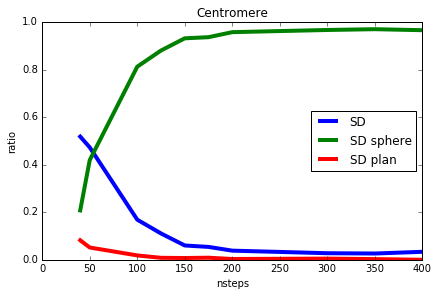

In [364]:
ratio = proportion_f_length("subd_post303Mean")
title("Centromere")
plot(ratio["length"],ratio["sub"],label="SD")
plot(ratio["length"],ratio["sub_sphere"],label="SD sphere")
plot(ratio["length"],ratio["sub_plan"],label="SD plan")

legend(loc="best")
xlabel("nsteps")
ylabel("ratio")
savefig("/home/jarbona/Dropbox/RNN/Paper/#Figures/Part_of_figures/FigUnicentro.png")

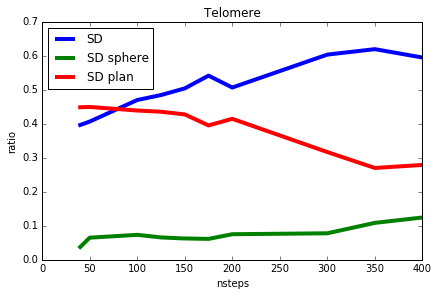

In [365]:
ratio = proportion_f_length("subd_teloRMean")
title("Telomere")
plot(ratio["length"],ratio["sub"],label="SD")
plot(ratio["length"],ratio["sub_sphere"],label="SD sphere")
plot(ratio["length"],ratio["sub_plan"],label="SD plan")

legend(loc="best")
xlabel("nsteps")
ylabel("ratio")
savefig("/home/jarbona/Dropbox/RNN/Paper/#Figures/Part_of_figures/FigUnitelo.png")

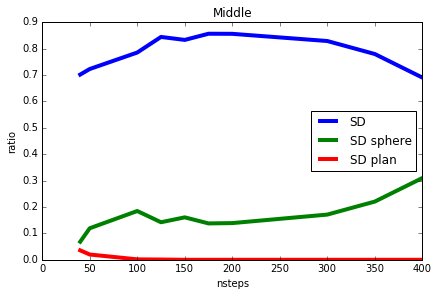

In [366]:
ratio = proportion_f_length("subd_post503Mean")
title("Middle")
plot(ratio["length"],ratio["sub"],label="SD")
plot(ratio["length"],ratio["sub_sphere"],label="SD sphere")
plot(ratio["length"],ratio["sub_plan"],label="SD plan")

legend(loc="best")
xlabel("nsteps")
ylabel("ratio")
savefig("/home/jarbona/Dropbox/RNN/Paper/#Figures/Part_of_figures/FigUnimiddle.png")

In [17]:
R = {}
for i in [10,50,300,780]:
    if i == 780:
        name = "subd_teloRMean"
    else:
        name = "subd_pos%iMean"%i
    ratio = proportion_f_length(name)
    R[name] = ratio

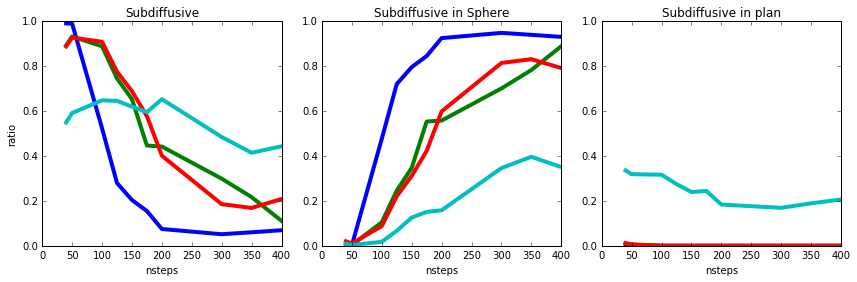

In [18]:
fig = figure(figsize=(12,4))

for i in [10,50,300,780]:
    if i == 780:
        name = "subd_teloRMean"
    else:
        name = "subd_pos%iMean"%i
    
    ratio = R[name]
    ax = fig.add_subplot(1,3,1)
    title("Subdiffusive")
    plot(ratio["length"],ratio["sub"],label="SD")
    xlabel("nsteps")
    ylim(0,1)

    ylabel("ratio")
    ax = fig.add_subplot(1,3,2)
    title("Subdiffusive in Sphere")

    plot(ratio["length"],ratio["sub_sphere"],label="SD sphere")
    xlabel("nsteps")
    ylim(0,1)

    ax = fig.add_subplot(1,3,3)
    title("Subdiffusive in plan")
    plot(ratio["length"],np.array(ratio["sub_plan"]) + np.array(ratio["sub_plan0p7"]) ,label="SD plan")

    #legend(loc="best")
    xlabel("nsteps")
    ylim(0,1)

fig.tight_layout()

In [157]:
r_sphere = []
for i in range(10,790,10):
    if i == 780:
        name = "subd_teloRMean"
    else:
        name = "subd_pos%iMean"%i
    normed,trajs,p = load_subd(name,400,sub=1,noise_level=0.)

    pred0 = graph3.predict({"input1":np.array([t for t in normed])},batch_size=50)
    pred0["category"] = pred0["category"][::,newaxis,::]

    pred_RNN_cat = pred0["category"]
    cat = np.array(pred_RNN_cat).argmax(axis=2)

    r_sphere.append( np.sum(cat == 8) / 1.0 / len(cat))


    #print len(cat)


IOError: [Errno 2] No such file or directory: 'subd_pos10Mean'

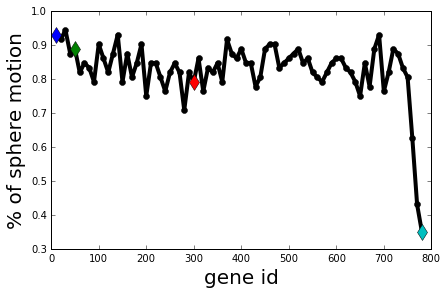

In [21]:
plot(range(10,790,10),r_sphere,"k-o")
plot([10],r_sphere[0],"bd",markersize=12)
plot([50],r_sphere[4],"gd",markersize=12)
plot([300],r_sphere[29],"rd",markersize=12)
plot([780],r_sphere[77],"cd",markersize=12)

xlabel("gene id",fontsize=20)
ylabel("% of sphere motion",fontsize=20)

##Proportion for trajectory equivalent to the simulated one
(Sub-sampling by a factor of 3)

[ 0.          0.          0.          0.          0.          0.50016706
  0.06047444  0.          0.30136986  0.13798864]
[ 0.00868694  0.          0.          0.          0.          0.66455062
  0.12596057  0.00501169  0.10190444  0.09388573]
[ 0.01236218  0.          0.          0.          0.          0.51887738
  0.09421985  0.00935516  0.08753759  0.27764784]


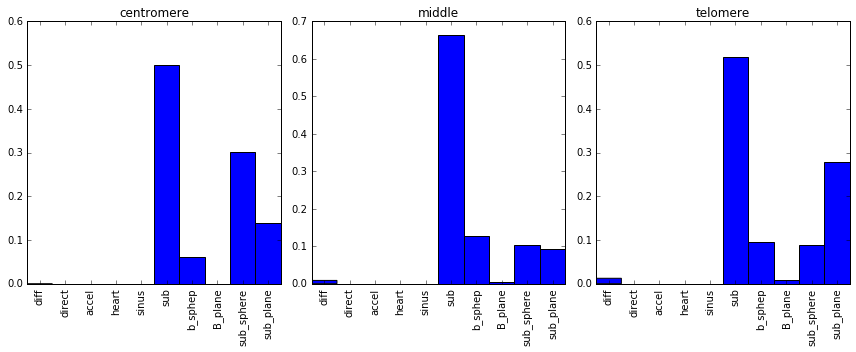

In [467]:
from Tools import M1


F = figure(figsize=(12,5))#(figsize=(7,5))
names = ["centromere","middle","telomere"]
for iname,name in enumerate(["subd_post303Mean","subd_post503Mean","subd_teloRMean"]):
    
    ax = F.add_subplot(1,3,iname + 1)
    ax.set_title(names[iname])
    
    normed,trajs,p = load_subd(name,40,sub=1,noise_level=0.,ndim=2)
    #pred0 = graph3.predict({"input1":np.array([t for t in normed])},batch_size=50)
    pred0 = graph_uniform2D.predict({"input1":np.array([t for t in normed])},batch_size=50)

    pred0["category"] = pred0["category"][::,newaxis,::]

    pred_RNN_cat = pred0["category"]

    maxp = []

    MR = M3b
    cat = collapse7(np.array(pred_RNN_cat).argmax(axis=2))
    r = hist(cat,bins=len(MR),range=[-0.5,len(MR)-0.5],normed=True)
    print r[0]
    a =xticks(np.arange(0.,len(MR),1), MR,rotation=90)
    xlim(-0.5,len(MR)-0.5)
    #ylim(0,1)
F.tight_layout()
#savefig("/home/jarbona/Dropbox/RNN/Paper/#Figures/FigS4_analyse_simulated_yeast_uniform.png")

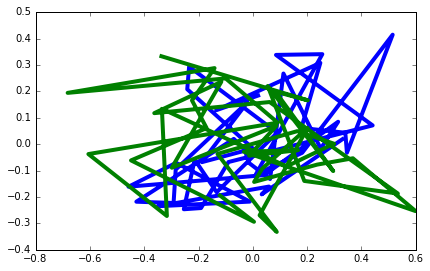

In [474]:
normed,trajs0,p = load_subd(name,40,sub=3,noise_level=0.00)
normed,trajs0p01,p = load_subd(name,40,sub=3,noise_level=0.5)
plot(trajs0[0][::,0],trajs0[0][::,1])
plot(trajs0p01[0][::,0],trajs0p01[0][::,1])

##Same analysis but with multiple motion:

0.948795180723
0.942771084337
0.848393574297


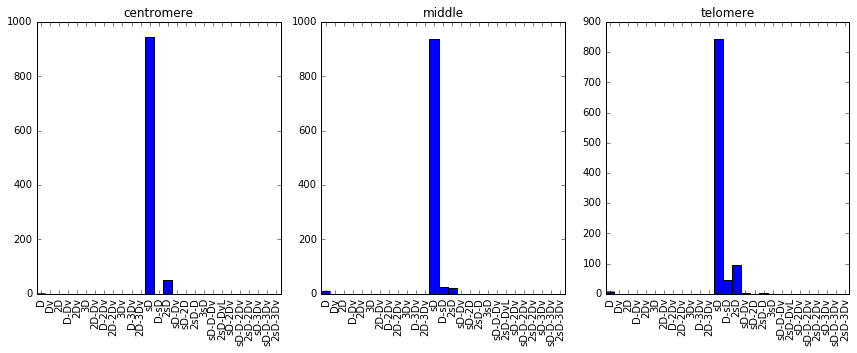

In [350]:
from Tools import M1b

F = figure(figsize=(12,5))
names = ["centromere","middle","telomere"]
for iname,name in enumerate(["subd_post303Mean","subd_post503Mean","subd_teloRMean"]):
    
    ax = F.add_subplot(1,3,iname + 1)
    ax.set_title(names[iname])
    
    pred0 = graph3D.predict({"input1":np.array([t for t in load_subd(name,40,sub=3)[0]])},batch_size=50)
    pred0["category"] = pred0["category"][::,newaxis,::]

    pred_RNN = pred0["output"]
    pred_RNN_cat = pred0["category"]

    maxp = []

    MR = M1b
    hist(np.array(pred_RNN_cat).argmax(axis=2),bins=len(MR),range=[-0.5,len(MR)-0.5])
    a =xticks(np.arange(0.,len(MR),1), MR,rotation=90)
    xlim(-0.5,len(MR)-0.5)
    print  np.sum(np.argmax(pred0["category"],axis=-1) == 12) / (1.0 * pred0["category"].shape[0])

F.tight_layout()
savefig("/home/jarbona/Dropbox/RNN/Paper/#Figures/FigS3_analyse_simulated_yeast_D-sD-Dv.png")

#Analysis of experimental motion

In [60]:
from scipy.io import loadmat
rep = [["../atlas_smb/ghislain/GAL2_080906/GAL2_Gal_080904/Analyses/GAL2_Gal_Analyse_G1/QC_OKauto_721nuc_nucloc_output_1015cells_suppl.mat",
        "Gal_Gal",38]]

rep += [["../atlas_smb/ghislain/GAL2_080906/GAL2_Glu_080904/Analyses/GAL2_Glu_Analyse_G1/QC_OKauto_759nuc_nucloc_output_1007cells_suppl.mat",
        "Gal_Glu",50]]
traj = {}
sigma = {}
maxi = 0
for R,w,maxl in rep:
    T = loadmat(R)
    sX,sY,sZ = [],[],[]
    print w , R
    traj[w] = []
    sigma[w] = []
    for X,Y,Z in zip(T["output"]["xspot"][0],T["output"]["yspot"][0],T["output"]["zspot"][0]):
        traj[w].append(np.zeros((3,maxl))+np.nan)
        sl = len(X[0])
        traj[w][-1][::,:sl] = np.array([X[0],Y[0],Z[0]])
        sX.extend(X[0][1:]-X[0][:-1])
        sY.extend(Y[0][1:]-Y[0][:-1])
        sZ.extend(Z[0][1:]-Z[0][:-1])

        maxi = max(maxi,len(X[0]))
    sigma[w] = [np.mean(np.abs(sX)),np.mean(np.abs(sY)),np.mean(np.abs(sZ))]
print maxi,sigma

Gal_Gal ../atlas_smb/ghislain/GAL2_080906/GAL2_Gal_080904/Analyses/GAL2_Gal_Analyse_G1/QC_OKauto_721nuc_nucloc_output_1015cells_suppl.mat
Gal_Glu ../atlas_smb/ghislain/GAL2_080906/GAL2_Glu_080904/Analyses/GAL2_Glu_Analyse_G1/QC_OKauto_759nuc_nucloc_output_1007cells_suppl.mat
50 {'Gal_Glu': [0.54733735247319104, 0.5559663922469229, 0.74021485012086097], 'Gal_Gal': [0.56290614689717966, 0.56244470209169728, 0.71056461297324536]}


In [61]:
from Tools import create_random_alpha,traj_to_dist
res = {}
for what in traj.keys():
    Normed = []
    trajs = []
    print len(traj[what])
    for T in traj[what]:

        alligned_traj,normed,alpha,_ = traj_to_dist(T.T/sigma[w],ndim=3)

        trajs.append(alligned_traj)
        Normed.append(normed)
        
    
    Normed = np.array(Normed)

    pred_RNN = []
    pred_RNN_cat = []

    pred0 = graph3.predict({"input1":np.array([t for t in Normed])},batch_size=50)
    three_l = True
    if three_l:
        pred0["category"] = pred0["category"][::,newaxis,::]

        #print pred0["category"][::,0,8:10][::,::-1].shape
    #pred0["category"][::,0,8:10] = pred0["category"][::,0,8:10][::,::-1]
    pred_RNN = pred0["output"]
    pred_RNN_cat = pred0["category"]
    
    which =  np.array(pred_RNN_cat).argmax(axis=2)
        #print which.shape
        #b =  pred_RNN_cat.max(axis=2) > 0.8
        #print b.shape
    res[what] = which[::,0]#[b]
        #print pred_RNN_cat.shape

#print traj["Gal_Gal"][-1]

759
721


In [54]:
#print res["Gal_Gal"]

[ 9  9  8 11  9  9 11  5  9 11  7  5 11 11  9 11  9  9  9  9  5 11 11  9 11
  7  9 11 11 11  7 11 11 11  9 11 11 11 11  9 11  7  9 11  5 11  9 11  9  9
  5  9 11  9  9  9  9  9  7 11  5 11  5  5 11  5 11  5 11  9 11  7  5  5  9
 11  9  8  5 11  9  9 11 11  9 11 11  5 11 11  9 11 11  5  5 11  9  5  5 11
 11 11  9 11  9  9  9  9 11  9 11  9 11 11  9  9  9 11  5  9  5  9 11 11 11
  7 11  5  9 11  9  9 11 11 11  9 11 11  8  9 11  9 11  9  8 11  5  9  9  9
  9  9  9  7  9 11 11 11 11 11  5  9  9 11  9  5  5  9  9  5  9  7 11  5  9
  9 11 11 11  9  5  9 11 11  5  9  8  5 11 11 11  5 11  9 11 11  9  9 11  9
  9 11  9  9  9 11 11  5  9 11 11 11 11 11  5 11  9 11  5  5  8  9  5  9  5
 11 11  5 11 11  9  9  9 11  9 11 11  9 11 11 11 11 11 11 11  9  9  9  5 11
  5  9 11  7  9 11 11 11  7  5  9  5  9 11  9  8  7 11 11  5  9  9 11 11 11
  9 11  9  5  9  9  9 11  9  9 11 11 11 11 11  9 11 11  9 11  5 11 11 11  9
 11  7  5  9  9 11 11  9 11 11 11  9  9 11 11 11  9 11  9 11  5  9 11 11 11
  5 11  5  9

(0, 0.5)

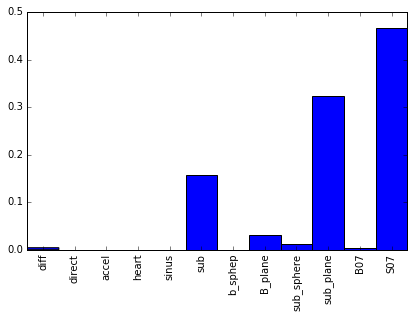

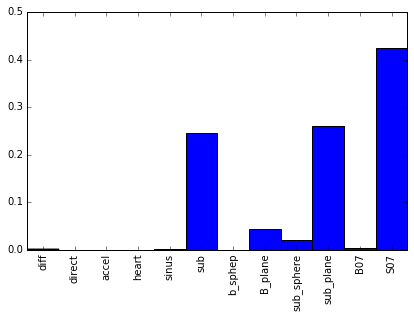

In [64]:
hist(res["Gal_Gal"],bins=27,range=[-0.5,26.5],normed=True)

if False:
    a =xticks(np.arange(0.,26.,1), M1,rotation=90)
else:
    a =xticks(np.arange(0.,len(M3),1), M3,rotation=90) 
xlim(-0.5,len(M3)-0.5)
ylim(0,0.5)

figure()
hist(res["Gal_Glu"],bins=27,range=[-0.5,26.5],normed=True)
if False:
    a =xticks(np.arange(0.,26.,1), M1,rotation=90)
else:
    a =xticks(np.arange(0.,len(M3),1), M3,rotation=90) 
xlim(-0.5,len(M3)-0.5)
ylim(0,0.5)

In [25]:
#Loading experimental data
from scipy.io import loadmat
import os
import copy

rep = [["../atlas_smb/ptherizo/pour tarn/dyn_4R15R_nucloc_output_631cells_suppl.mat",["4R","15R"]]] #Mean 0.91
rep += [["../atlas_smb/ptherizo/pour tarn/4R13R_dyn_nucloc_output_641cells_suppl.mat",["4R","13R"]]] # Mean 0.92
rep += [["../atlas_smb/ptherizo/pour tarn/dyn_16R_URA3_nucloc_output_599cells_suppl.mat",["16R","URA3"]]] #Mean 0.99
rep += [["../atlas_smb/shared/A_LOCI/Telomeres/Dynamic/6R3L/nucloc_output_1176cells_suppl.mat",["6R","3L"]]]
rep +=[["../atlas_smb/shared/A_LOCI/Telomeres/Dynamic/6R4R/nucloc_output_438cells_suppl.mat",["6R","4R"]]]


rep = [ ["expe-loci/"+os.path.split(irep)[1],loci] for irep,loci in rep]
DataTMean = []
DataTMeanp = []
DatapInte = []
DataT = []
traj = {}
for R,[ch1,ch2] in rep:
    #print R
    if not traj.has_key(ch1):
        traj[ch1] = []
    if not traj.has_key(ch2):
        traj[ch2] = []
    
    r = loadmat(R,struct_as_record=False, squeeze_me=True)
    xr = np.arange(0.03,1.,0.03)

    #print DatapInte
    
    for j in range(len(r['output'])):
        a = r['output'][j]
        d = [ np.sqrt(  (a[i].xgene - a[i].xgene_ch2)**2 + \
                       (a[i].ygene - a[i].ygene_ch2)**2 + \
                      (a[i].zgene - a[i].zgene_ch2)**2)  for i in range(40)]
        traj[ch1].append( np.array([ [a[i].xgene ,a[i].ygene ,a[i].zgene] for i in range(40)]))
        traj[ch2].append(np.array([ [a[i].xgene_ch2 ,a[i].ygene_ch2 ,a[i].zgene_ch2] for i in range(40)]))
        #plot(d)
     
    #plot(xr,Tmean,label=str(np.mean(T)))
#print a[0].dx
#plot(r['output'].T)
trajc = copy.deepcopy(traj)

#Loading seb data

In [478]:
root = "/home/jarbona/Downloads/"

l = [ ["R1",["YHB45_nZ_%i_tracks.mat"%i for i in range(1,4)]],
      ["R2",["YHB53_nZ_%i_tracks.mat"%i for i in range(1,4)]],
      ["R4",["YPT224_nZ_%i_tracks.mat"%i for i in range(1,5)]]]
#trac = {}
for key,files in l:
    trajc[key] = []
    for f in files:
        r = loadmat(root+"/" + f,struct_as_record=False, squeeze_me=True)
        trajc[key].extend(r["track_all_locus"])
    trajc[key] = np.array(trajc[key])[::,:850,::]
    """
    s = trajc[key].shape
    #print s , s[0]*4,212,2
    trajc[key] = trajc[key].reshape((s[0]*5,170,2))
    
    tmp = []
    i = 0
    for traj in trajc[key]:
        if np.sum(np.isnan(traj)) < 1:
            tmp.append(traj)
            i += 1
    print i / 1.0 / s[0] / 4
    trajc[key] = tmp"""

[ 1.68077052  1.95778728]


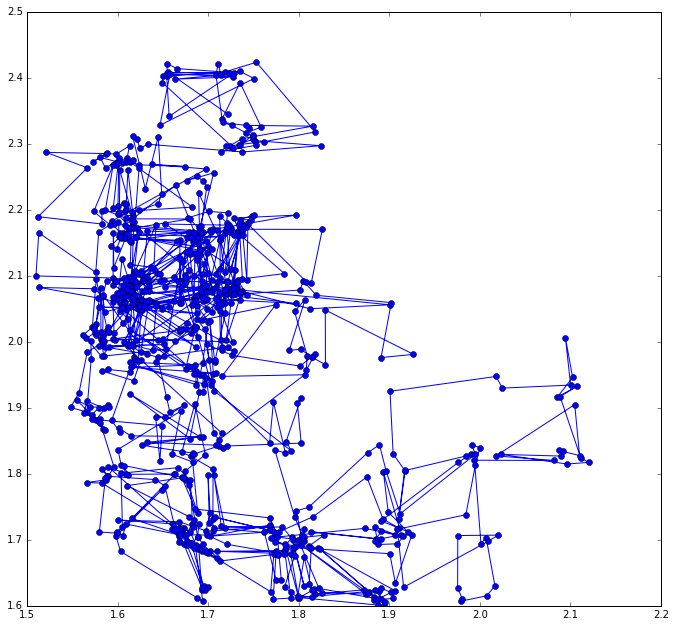

In [488]:
figure(figsize=(10,10))
t = 1
plot(trajc["R4"][t][::,0],trajc["R4"][t][::,1],"o-",linewidth=1)
print trajc["R4"][0][0]

## Analysing data with 

In [473]:
from Tools import traj_to_dist,get_parameters
Normed = []
res = {}
resp= {}
size=200
D = {}
Keys = ["4R","15R","13R","16R","6R","3L","URA3"]
Keys = ["R1","R2","R4"]
def get_result(graph,ndim,):
    print trac.keys()
    nt = 1
    
    norm = [[] for i in range(ndim)]
            
    for key in Keys :
        for i in range(0,len(trajc[key])/nt):
            
            dtraj = trajc[key][i][1:,::] - trajc[key][i][:-1,::] 

            for j in range(dtraj.shape[1]):
                norm[j].extend(dtraj[::,j].tolist())

                #norm[j].extend(trajc[key][i][::,j].tolist())
    #print norm
    sigmas = np.median(np.abs(norm),axis=1)
    for key in  Keys:
        trajs=[]

        Normed = []
        print key,
        
        #Norm three coordinate
        
        norm = [[] for i in range(ndim)]
        for i in range(0,len(trajc[key])/nt):
            dtraj = trajc[key][i][1:,::] - trajc[key][i][:-1,::] 
            for j in range(dtraj.shape[1]):
                
                norm[j].extend(dtraj[::,j].tolist())
                #norm[j].extend(trajc[key][i][::,j].tolist())

        #sigmas = np.array(norm).std(axis=1)
        sigmas = np.median(np.abs(norm),axis=1)
        
        
        print sigmas
        #break

        for i in range(0,len(trajc[key])/nt):


            T = trajc[key][i][:-1]

            #alligned_traj,normed,alpha,_ = traj_to_dist(trajc[key][i][:-1,::]/sigmas,ndim=3)

            T = T[::,:ndim] #/sigmas[:ndim]
            alligned_traj,normed,alpha,_ = traj_to_dist(T,ndim=ndim)

            trajs.append(alligned_traj)
            Normed.append(normed)


        Normed = np.array(Normed)

        pred_RNN = []
        pred_RNN_cat = []

        pred0 = graph.predict({"input1":np.array([t for t in Normed])},batch_size=50)
        three_l = True
        if three_l:
            pred0["category"] = pred0["category"][::,newaxis,::]

            #print pred0["category"][::,0,8:10][::,::-1].shape
        #pred0["category"][::,0,8:10] = pred0["category"][::,0,8:10][::,::-1]
        
        pred_RNN_cat = pred0["category"]
        #print pred_RNN_cat.shape
        which =  np.array(pred_RNN_cat).argmax(axis=2)
        #print which.shape
        #b =  pred_RNN_cat.max(axis=2) > 0.8
        #print b.shape
        res[key] = which#[b]
        resp[key] = pred_RNN_cat.max(axis=2) 

        D[key] = {7:[],6:[],12:[]}
        Deltas = []
        for t,p,c in zip(trajs,pred_RNN,pred_RNN_cat):
            Deltas.append(np.sum((t[1:]-t[:-1])**2,axis=1))
            if np.argmax(c,-1) == [14]:
                R = get_parameters(t,np.argmax(p,-1),1,1,2)
                #print R
                #print 
                for V in R:
                    if V[0] in [6,7]:
                        #print V
                        D[key][V[0]].append(V[2][2])
            if np.argmax(c,-1) == [12]:
                R = get_parameters(t,np.argmax(p,-1),1,1,2)
                for V in R:
                    if V[0] in [6]:
                        #print V
                        D[key][12].append(V[2][2])
                        
    return res,pred0
    

In [259]:
T = trajc[key][i][:-1]
Tp = T[1:]-T[:-1]
Tp /= np.array([1,1,1.])
Tp = np.cumsum(np.concatenate(([[0,0,0]],Tp)),axis=0)

print Tp.shape

(39, 3)


In [228]:
graph3.load_weights("../cluster_theano_myriad0/weight-folder/4layer-LSTM-uniform-add-error-and-400-3D-suite3-new-noise_7_138")

In [260]:
res,resp = get_result(graph3,ndim=3)

for key in res.keys():
    res[key] = collapse7(res[key])

4R [ 0.08896015  0.09033802  0.17402939]
15R [ 0.07974864  0.07990824  0.22242935]
13R [ 0.08332838  0.08366408  0.22827922]
16R [ 0.09704925  0.09578624  0.17116219]
6R [ 0.09453154  0.09378298  0.16536971]
3L [ 0.08131239  0.0798554   0.2179872 ]
URA3 [ 0.08409115  0.08252465  0.21730492]


In [192]:
res,resp = get_result(graph3D,ndim=3)

4R [ 0.08896015  0.09033802  0.17402939]
15R [ 0.07974864  0.07990824  0.22242935]
13R [ 0.08332838  0.08366408  0.22827922]
16R [ 0.09704925  0.09578624  0.17116219]
6R [ 0.09453154  0.09378298  0.16536971]
3L [ 0.08131239  0.0798554   0.2179872 ]
URA3 [ 0.08409115  0.08252465  0.21730492]


In [474]:
res,pred0 = get_result(graph2D,ndim=2)

[]
R1 [ 0.02206849  0.02258983]
R2 [ 0.01853018  0.01950286]
R4 [ 0.01266715  0.01264705]


In [468]:
res,resp = get_result(graph_uniform2D,ndim=2)

for key in res.keys():
    res[key] = collapse7(res[key])

[]
R1 [ 0.02206849  0.02258983]
R2 [ 0.01853018  0.01950286]
R4 [ 0.01266715  0.01264705]


In [385]:
#Concatenate all the telomeres together
tot = []
for key in res.keys():
    if key != "URA3":
        #print res[key].shape
        tot.extend(res[key])

tot = np.array(tot)[::]


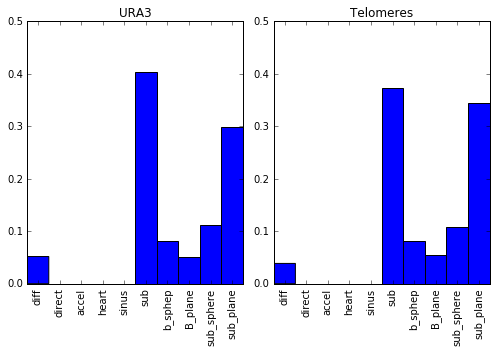

In [386]:
f = figure(figsize=(7,5))
ax = f.add_subplot(1,2,1)
hist(res["URA3"],bins=27,range=[-0.5,26.5],normed=True)
title("URA3")
allt = False
Mu = M3b
if allt:
    a =xticks(np.arange(0.,26.,1), M1,rotation=90)
    xlim(-0.5,len(M1)-0.5)

else:
    a =xticks(np.arange(0.,len(Mu),1), Mu,rotation=90) 
    xlim(-0.5,len(Mu)-0.5)
ylim(0,0.5)
ax = f.add_subplot(1,2,2)

hist(tot,bins=27,range=[-0.5,26.5],normed=True)
title("Telomeres")
if allt:
    a =xticks(np.arange(0.,26.,1), M1,rotation=90)
    xlim(-0.5,len(M1)-0.5)

else:
    a =xticks(np.arange(0.,len(Mu),1), Mu,rotation=90) 
    xlim(-0.5,len(Mu)-0.5)
ylim(0,0.5)
f.tight_layout()

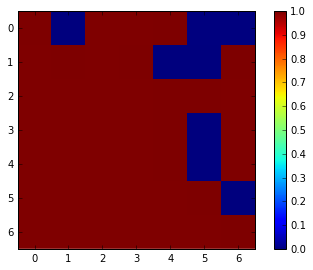

In [331]:
Keys= ["4R","15R","13R","16R","6R","3L","URA3"]

p_v = np.zeros((len(Keys),len(Keys)))+1
for ikey,key in enumerate(Keys,0):
    for ikey2,key2 in enumerate(Keys[ikey+1:],ikey+1):

        data = histogram(res[key],bins=len(MR),range=[-0.5,len(MR)-0.5],normed=False)
            #Ref 
        data_ref = histogram(res[key2],bins=len(MR),range=[-0.5,len(MR)-0.5],normed=False)
        
        xi = chi2_contingency([data[0] + 1,2*data_ref[0] + 1])
        p_v[ikey,ikey2] = xi[1]
r = np.log(p_v)
r[r > -5] = 1
r[r <= -5] = 0
imshow(r,interpolation="None")
colorbar()

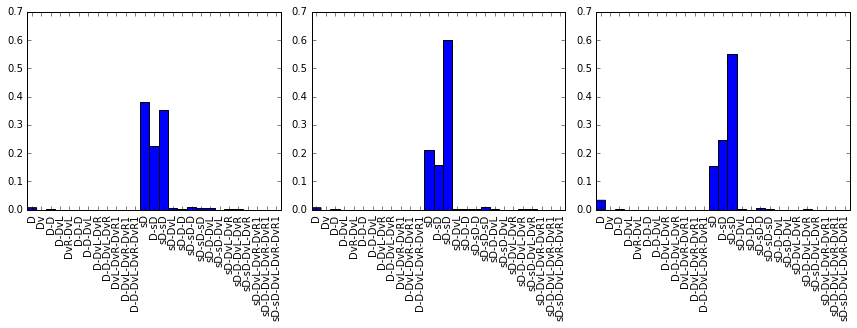

In [471]:
from scipy.stats import chisquare
from scipy.stats import chi2_contingency
Keys  = res.keys()

Keys= ["4R","15R","13R","16R","6R","3L","URA3"]
Keys = ["R1","R2","R4"]
F = figure(figsize=(12,12))
    
for ikey,key in enumerate(Keys,1):
    ax = F.add_subplot(3,3,ikey) 
    
    rest = res[key]
    which = rest[1::2] == rest[::2]
    filtered = False
    if filtered:
        rest = rest[::2][which]
        
    
    MR = M1
    hist(rest,bins=len(MR),range=[-0.5,len(MR)-0.5],normed=True)
    a =xticks(np.arange(0.,len(MR),1), MR,rotation=90)
    ylim(0,0.7)
    xlim(-0.5,len(MR)-0.5)
    
    #CHI
    data = histogram(rest,bins=len(MR),range=[-0.5,len(MR)-0.5],normed=True)
    #Ref 
    
    if res.has_key("URA3"):
        data_ref = histogram(res["URA3"],bins=len(MR),range=[-0.5,len(MR)-0.5],normed=True)

        #print data[0] + 1
        #print data_ref[0]
        #xi = chisquare([f_obs=data[0] + 1,f_exp=2*data_ref[0] + 1])
        xi = chi2_contingency([data[0] + 1,2*data_ref[0] + 1])
        ax.set_title(key+ " Xi %.1f % .1e"%(xi[0],xi[1]))

    
F.tight_layout()
    

#MSD and scaling time

In [115]:
#Definiton of MSD
def MSD(Coords,skip=10,stop=1000,nonOverlap=True):
    #print "MSD doing the calc"
    end = len(Coords[0])
    deb=0
    stop=stop
    indep=2000
    skip = skip
    #nonOverlap=True

    msd = np.zeros(end-deb-stop)
    for k in range(1,end-deb-stop,skip):
        n = 0
        if nonOverlap:
            indep = 0 + k
        else:
            indep = 1
        for i in range(0,end-k-deb,indep):
            start = Coords[::,i]
            pos = Coords[::,i+k]
#            import pdb
#            pdb.set_trace()
            msd[k] += np.sum((start-pos)**2)
            n += 1

        msd[k]  =  msd[k]  /n
    return msd[1::skip]

In [463]:
Names = ["subd_post513Mean","subd_teloRMean"]
Res_s = {}
sub = 1
for name in Names:
    with open(name,"r") as f:
        [x,y,z] = cPickle.load(f)
    Coord = np.array([x,y,z])
    Coord = Coord[::,::sub]
    print Coord.shape
    Res_s[name] = MSD(Coord,skip=1,stop=0)
    

(3, 119820)
(3, 119820)


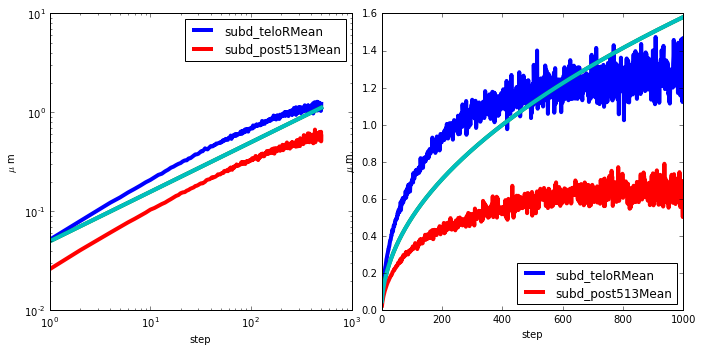

In [464]:
f = figure(figsize=(10,5))
ax = f.add_subplot(121)
end = 500
for k in Res_s:
    time = np.arange(1,len(Res_s[k][:end])+1)
    plot(time,Res_s[k][:end],label=k)
    plot(time,0.05*time**0.5)
xlabel("step")
ylabel(r"$\mu$ m")
xscale("log")
yscale("log")
legend(loc="best")
ax = f.add_subplot(122)
end = 1000
for k in Res_s:
    time = np.arange(1,len(Res_s[k][:end])+1)
    plot(time,Res_s[k][:end],label=k)
    plot(time,0.05*time**0.5)
xlabel("step")
ylabel(r"$\mu$ m")

legend(loc="best")

In [ ]:
Keys= ["4R","15R","13R","16R","6R","3L","URA3","13R"]
Keys = ["R1","R2","R4"]
MSD_p = {}
for k in Keys:
    print k
    MSDs = []
    for t in trajc[k]:
        #Nt = [t[1:]-t[:-1] for t in trajc[k]]

        #Nt = np.cumsum(np.concatenate(Nt,axis=0),axis=0)
        #t = np.concatenate(trajc[k],axis=0)
        #print Nt.shape
        #print t.shape
        scale = np.array([0.073,0.073,0.250])
        MSDs.append(MSD(t.T,skip=1,stop=0))  #*scale[::,newaxis]
    MSDs = np.mean(np.array(MSDs),axis=0)
    MSD_p[k] = MSDs
    
    #lic2[0]["MSD"+k] =  MSD(t.T,skip=1)[:200]

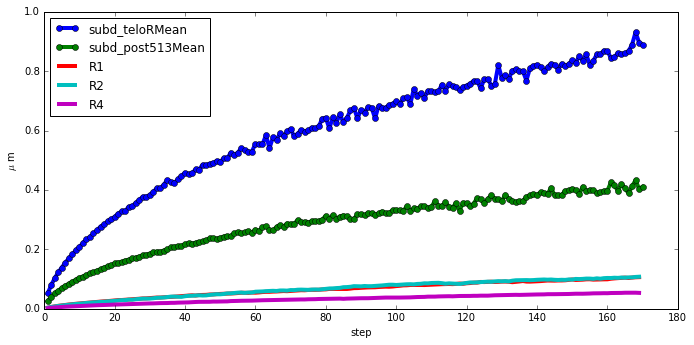

In [465]:
f = figure(figsize=(10,5))
ax = f.add_subplot(111)
end = 170
for k in Res_s:
    time = np.arange(1,len(Res_s[k][:end])+1)
    plot(time,Res_s[k][:end],"-o",label=k)
xlabel("step")
ylabel(r"$\mu$ m")

legend(loc="best")

for k in Keys:
    time = np.arange(1,len(MSD_p[k])+1)
    plot(time,MSD_p[k],label=k)
legend(loc="best")

(2444, 168)
(2444, 168)
(2444, 168)
(2444, 168)
(2444, 168)
(2444, 168)
(2444, 168)
(2444, 168)
(2444, 168)
(2444, 168)
(2444, 168)
(2444, 168)
(2444, 168)
(2444, 168)


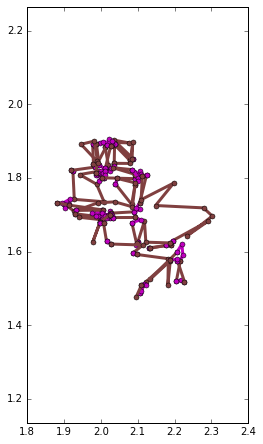

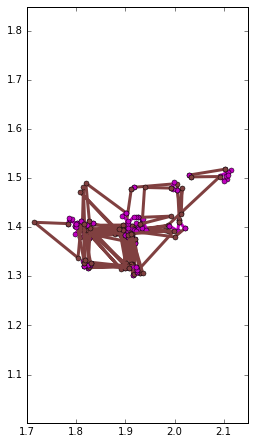

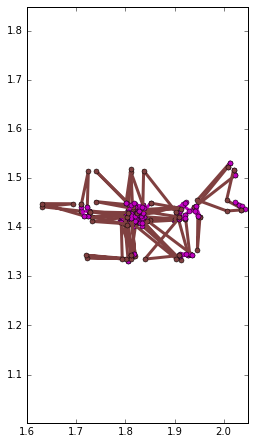

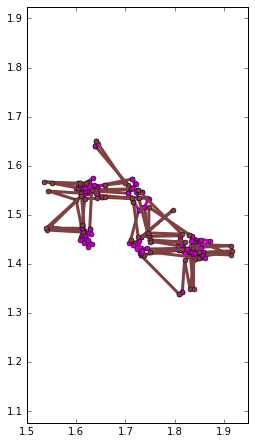

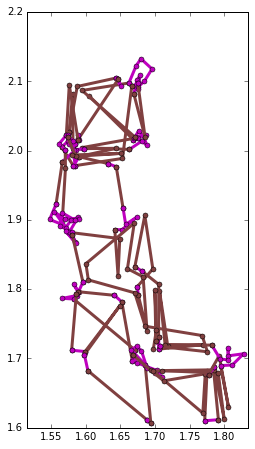

...

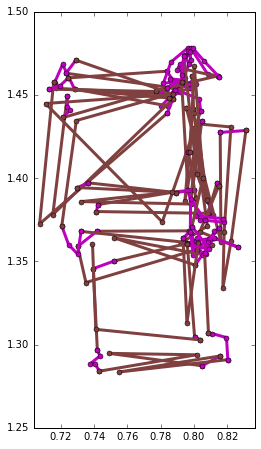

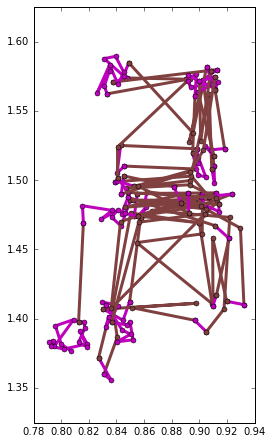

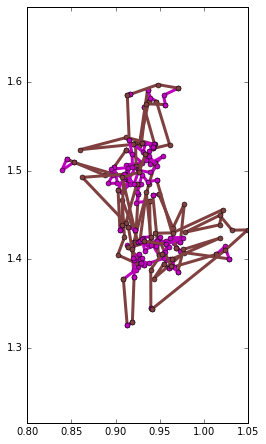

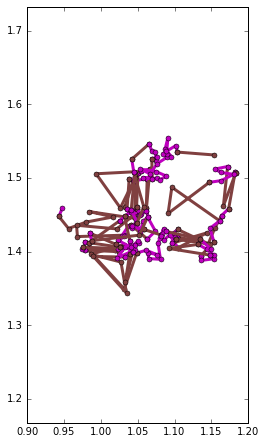

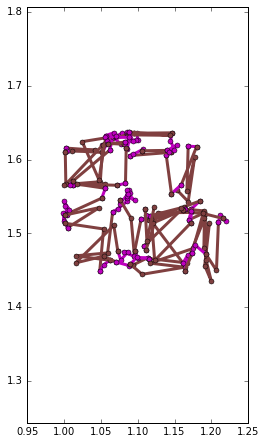

In [477]:
from Tools import plot_label,Labels,M0,clean,M1
#print score.shape
#import matplotlib as plt
l = 200
key="R4"
for i in range(1,15,1):
    


    fig = figure(figsize=(15,7))
    ax = fig.add_subplot(141)
    
    #print np.argmax(pred0["output"],axis=-1).shape
    plot_label(trajc[key][i][:-1,::],np.argmax(pred0["output"][i],axis=-1),remove6=30)
    plt.axis('equal')
    """
    ax = fig.add_subplot(143)
    plot( init[:l])
   
    plot(classi_RNN[:l],label="%i N missed %i,"%(i,np.sum(classi_RNN[:l] != init[:l])))
    legend()
    
    ax = fig.add_subplot(144)
    #print pred_RNN_cat[i,0].shape
    #print pred_RNN_cat[i].shape
    pcat  = pred_RNN_cat[i][0]
    bar(np.arange(len(pcat))-0.5,pcat,label= "%i %s predict %s"%(np.argmax(Y_test_cat[i]),
                                                                  M1[np.argmax(Y_test_cat[i])],
                                                                    M1[np.argmax(pcat,-1)]))
    gt = np.argmax(Y_test_cat[i][0])
    bar(gt-0.5,pcat[gt],color="r")
    #xticks(range(27), M0,rotation=90)

    legend()
    
"""